In [102]:
import pathlib
import cv2
import numpy as np
import time
import itertools

from collections import Counter

from tqdm import tqdm

from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from skimage import data, img_as_float
from skimage.measure import compare_ssim as ssim


class ImageGrammarProcessor():
    
    def __init__(self, equalize=True):
        scales = np.array(0.01)
        #scales = np.append(scales, np.arange(0.01,0.05,0.02))
        scales = np.append(scales, np.arange(0.001,0.01,0.002))
        self.scales = scales
        self.equalize = equalize
        print(self.scales)
        
        
    def calculate_t_frames(self, file_path, scaling=None, exploring=True):
        img_arr = None
        #for current_file in tqdm(sorted(pathlib.Path(file_path).iterdir())):
        for current_file in sorted(pathlib.Path(file_path).iterdir()):

            file_string = str(current_file)
            img = cv2.imread(file_string, flags=cv2.IMREAD_GRAYSCALE)
            if self.equalize:
                img = cv2.equalizeHist(img)

            if scaling is not None:
                img = cv2.resize(img, None,
                                 fx=scaling, fy=scaling, 
                                 interpolation=cv2.INTER_AREA)
            if img_arr is None:
                height, width = np.shape(img)[:2]
                flat_d = height * width
                img_arr = np.zeros((flat_d,0))

                if exploring: # Show scaled image for exploring
                    fig = plt.figure()
                    fig.add_subplot(1,1,1)
                    img = img_as_float(img)
                    plt.imshow(img, cmap=plt.cm.gray, vmin=0, vmax=1)
                    plt.show()

            img_1d = np.expand_dims(np.ravel(img), axis=1)
            img_arr = np.append(img_arr, img_1d, axis=1)

        img_diff = np.diff(img_arr)
        img_norms = np.linalg.norm(img_diff, axis=0)

        avg = np.mean(img_norms)
        std = np.std(img_norms)
        transition_frames = np.argwhere(img_norms > avg).flatten()
        transition_values = img_norms[img_norms > avg]
        transition_frames_std = np.argwhere(img_norms > avg+std).flatten()
        transition_values_std = img_norms[img_norms > avg+std]

        return (transition_frames, transition_values, 
                avg, std,
                transition_frames_std, transition_values_std)

    
    def get_files_list(self, file_path, transition_frames):
        files_list = list()
        first_file = sorted(pathlib.Path(file_path).iterdir())[0]
        start_int = int(first_file.stem)
        #for i in tqdm(transition_frames):
        for i in transition_frames:
            files_list.append(str(pathlib.Path(file_path)
                          .joinpath('{:03d}.jpg'.format(i+start_int))))
        return files_list

    
    def display_images(self, files_list):
        fig = plt.figure(1, (14., 10.))
        img_per_row = 7
        grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(len(files_list)//img_per_row+1, img_per_row),  # creates 2x2 grid of axes
                     axes_pad=0.05,  # pad between axes in inch.
                     )
        #for i,f in tqdm(enumerate(files_list)):
        for i,f in enumerate(files_list):
            img = cv2.imread(f, flags=cv2.IMREAD_GRAYSCALE)
            if self.equalize:
                img = cv2.equalizeHist(img)
            img = img_as_float(img)
            grid[i].axis('off')
            grid[i].imshow(img, cmap=plt.cm.gray, vmin=0, vmax=1)
        return grid
    
    
    def run(self, file_path, verbose=0):
        scaling_options = self.scales
        print(scaling_options)
        t_frames_list = list()
        std_frames_list = list()
        for scaling in scaling_options:
            print("scale: {}".format(scaling))
            (transition_frames, transition_values, 
             avg, std,
             transition_frames_std, transition_values_std) = self.calculate_t_frames(file_path, scaling)
            files_list = self.get_files_list(file_path, transition_frames)
            std_files_list = self.get_files_list(file_path, transition_frames_std)

            t_frames_list.append(transition_frames)
            std_frames_list.append(transition_frames_std)
            if verbose > 0:
                self.display_images(files_list)
                plt.show()
                print("Count: {}\n".format(len(transition_frames)))
                time.sleep(1)
                self.display_images(std_files_list)
                plt.show()
                print("Count: {}\n".format(len(transition_frames_std)))
        if verbose > 1:
            print("T Frames:\n{} \n\nSTD Frames:\n{}".format(t_frames_list, std_frames_list))

        return (t_frames_list, std_frames_list)
    
    
    def plot_counts(self, frames_list):
        for scale, t_frames in zip(self.scales, frames_list):
            scale_label = list(itertools.repeat(scale, len(t_frames)))
            plt.plot(t_frames, scale_label, ".")
        plt.show()

    def get_counts(self, frames_list):
        counts = Counter()
        for t_frames in frames_list:
            counts += Counter(t_frames)
        c = dict(counts)
        d = [k for k,v in c.items() if v > 4]
        return (d)
        
    def get_sift_frames(self, file_path, verbose=0):
        t_frames_list, std_frames_list = self.run(file_path, verbose=verbose)
        self.plot_counts(t_frames_list)
        self.plot_counts(std_frames_list)
        sift_t = self.get_counts(t_frames_list)
        sift_std = self.get_counts(std_frames_list)
        print("Sift_t: {}\nSift_std: {}\n".format(sift_t, sift_std))

        return (sift_t, sift_std)

[0.01  0.001 0.003 0.005 0.007 0.009]
[0.01  0.001 0.003 0.005 0.007 0.009]
scale: 0.01


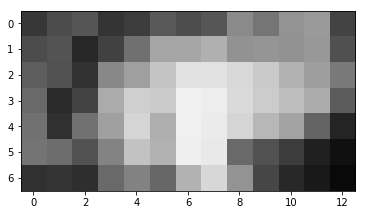

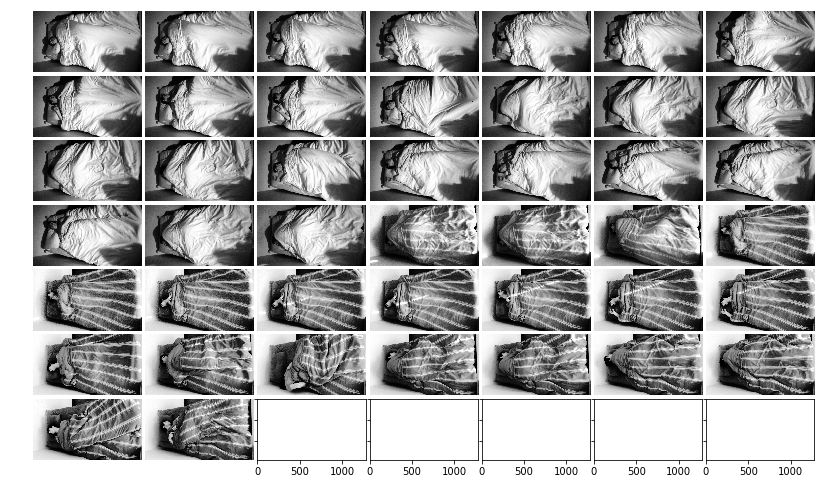

Count: 44



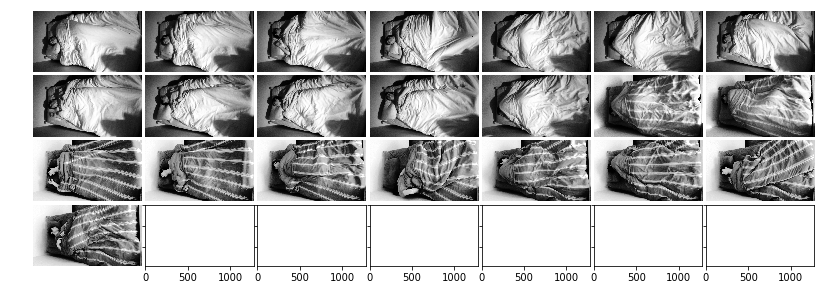

Count: 22

scale: 0.001


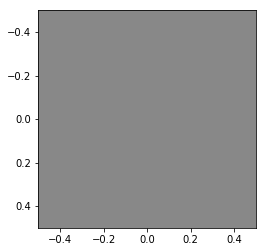

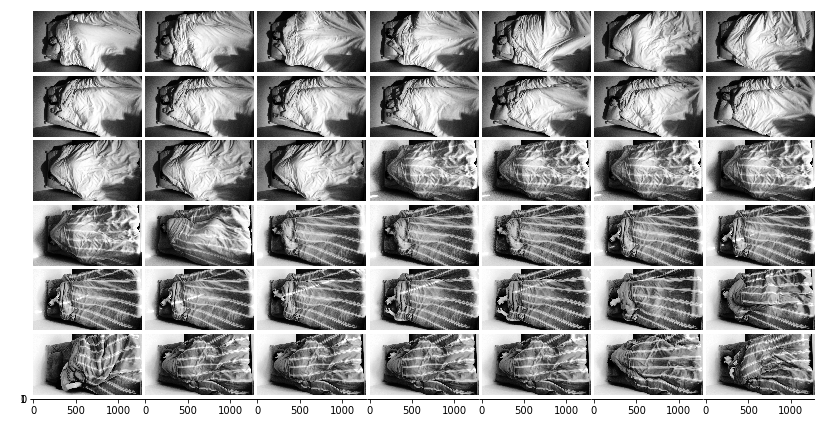

Count: 42



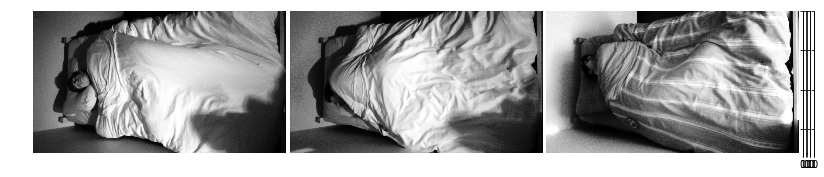

Count: 3

scale: 0.003


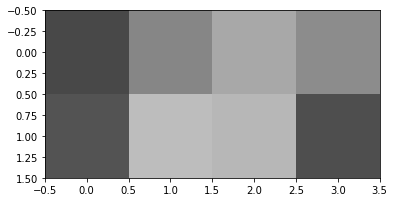

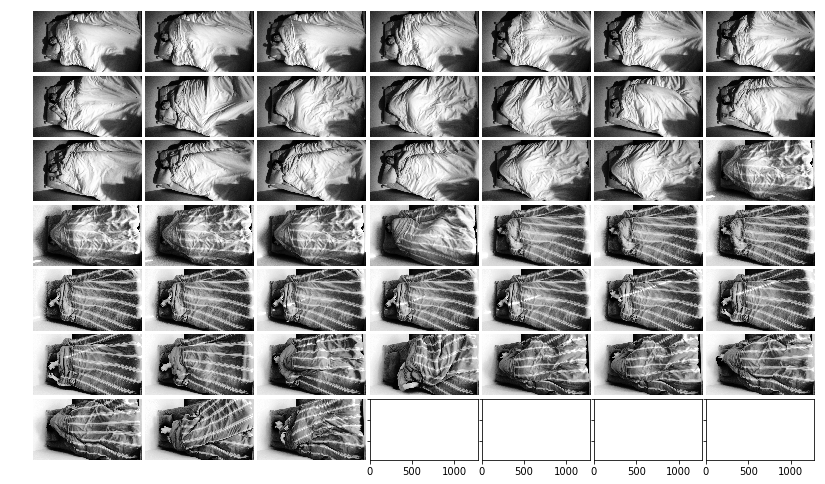

Count: 45



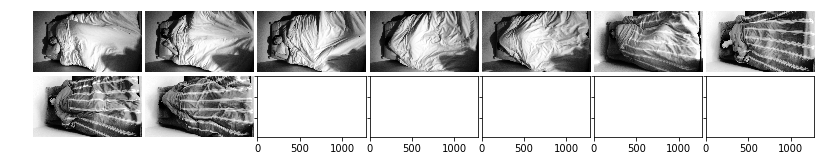

Count: 9

scale: 0.005


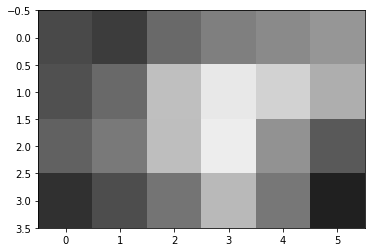

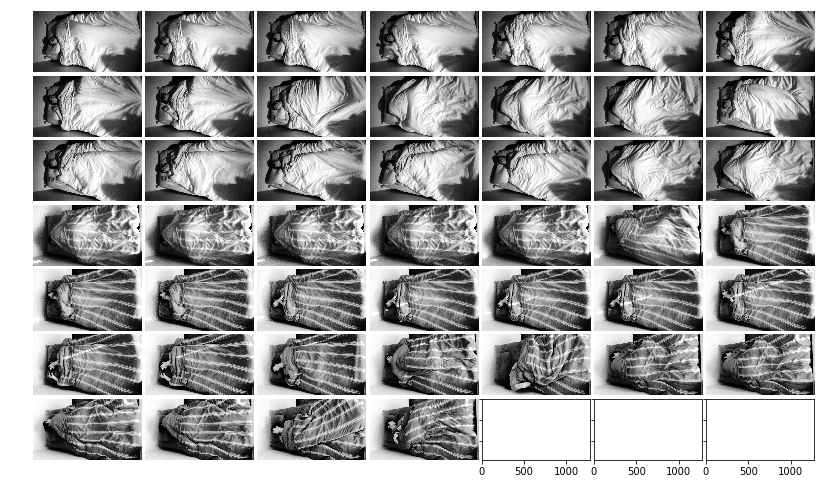

Count: 46



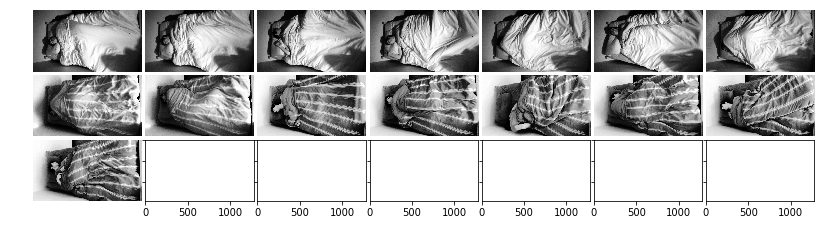

Count: 15

scale: 0.007


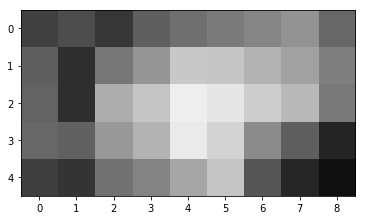

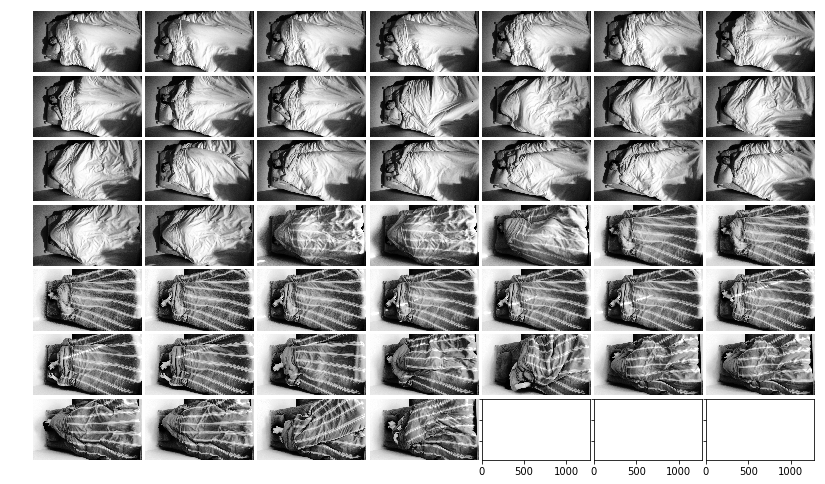

Count: 46



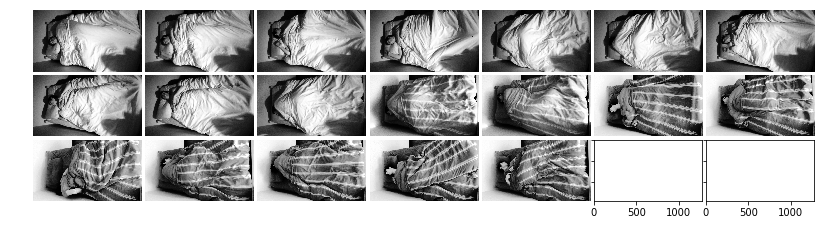

Count: 19

scale: 0.009000000000000001


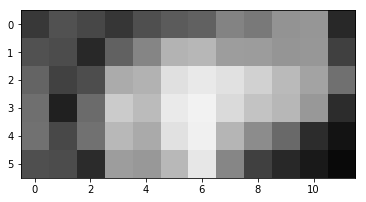

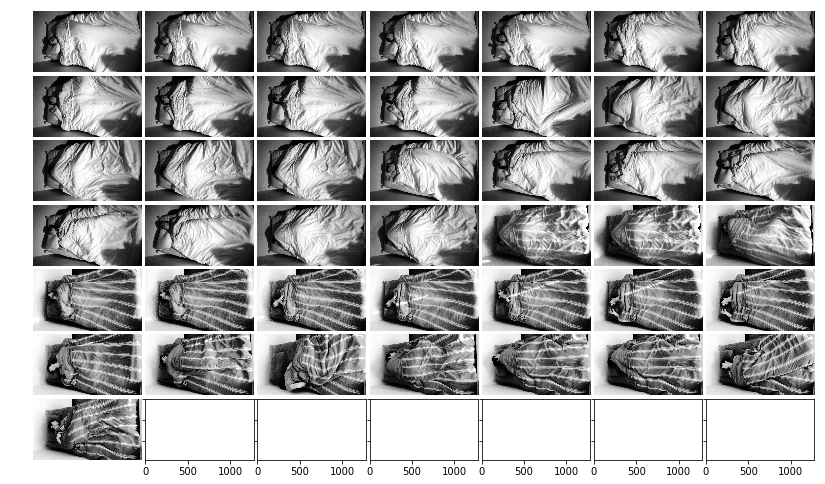

Count: 43



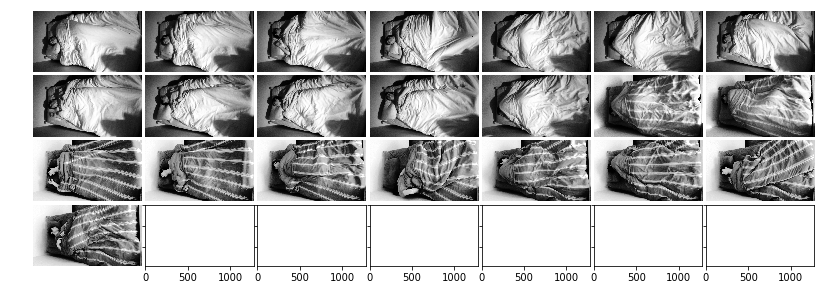

Count: 22



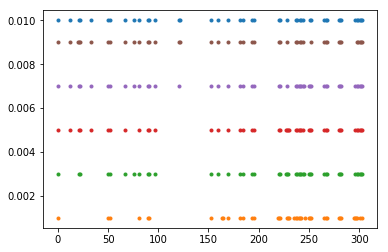

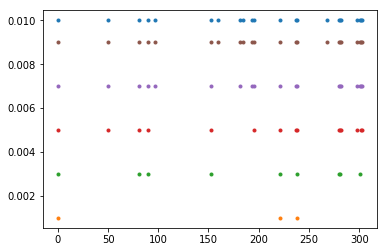

Sift_t: [0, 21, 22, 50, 52, 67, 81, 90, 91, 97, 153, 159, 169, 181, 184, 193, 195, 220, 221, 228, 237, 238, 241, 242, 244, 251, 252, 265, 267, 268, 280, 281, 282, 296, 298, 299, 301, 302, 303]
Sift_std: [0, 81, 90, 153, 221, 238, 280, 281]



In [103]:
pr = ImageGrammarProcessor()

t_frames_list, std_frames_list = pr.get_sift_frames('./test_data/2019-03-03/', verbose=1)

In [110]:
t_list = pr.get_counts(t_frames_list)
frame_len = len(t_list)
print(frame_len)

39


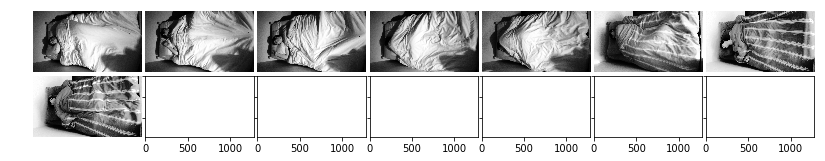

In [128]:
frames_int = pr.get_counts(std_frames_list)
f_list = pr.get_files_list('./test_data/2019-03-03/', frames_int)
pr.display_images(f_list)

[0.01  0.001 0.003 0.005 0.007 0.009]
[0.01  0.001 0.003 0.005 0.007 0.009]
scale: 0.01


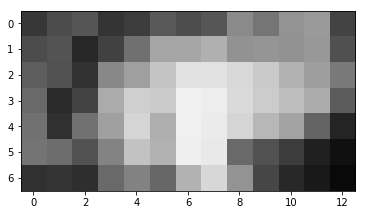

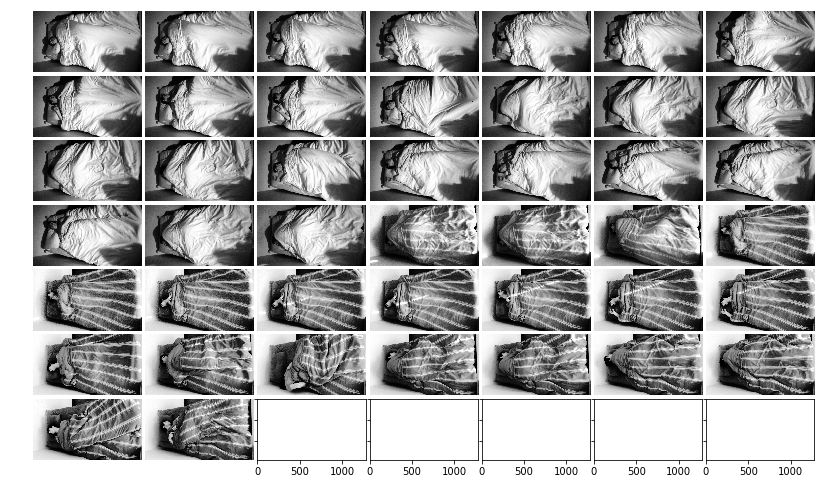

Count: 44



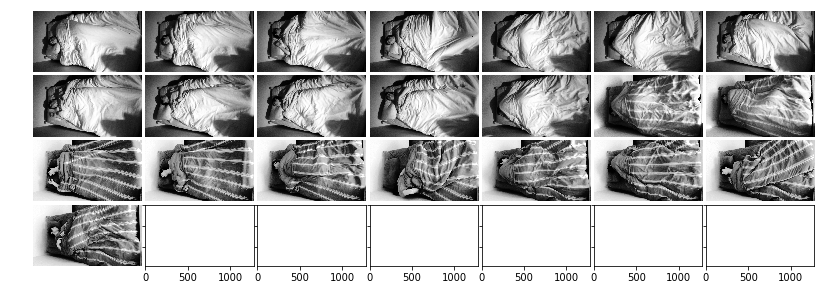

Count: 22

scale: 0.001


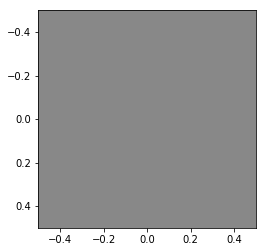

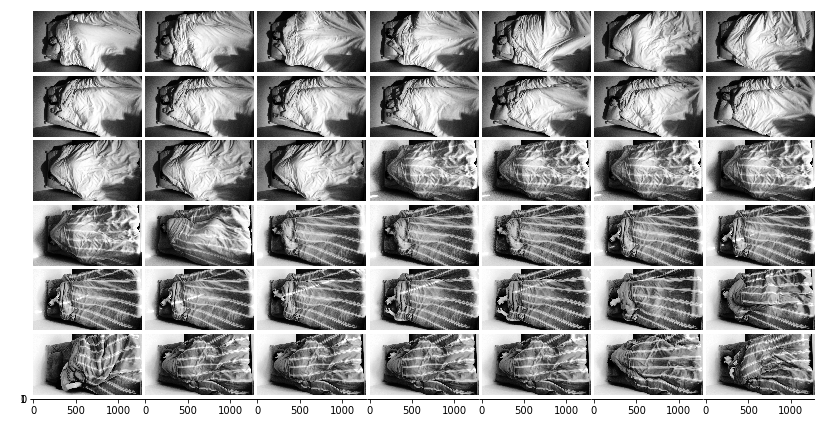

Count: 42



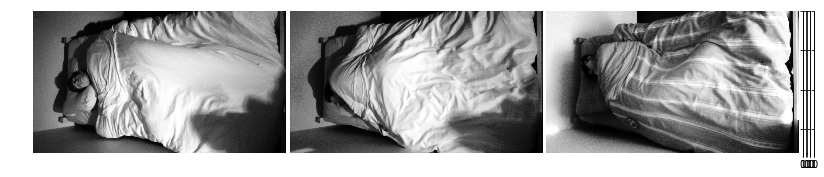

Count: 3

scale: 0.003


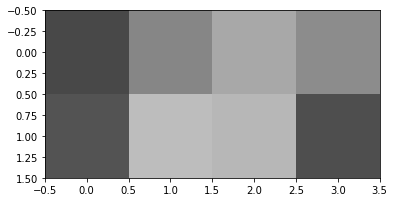

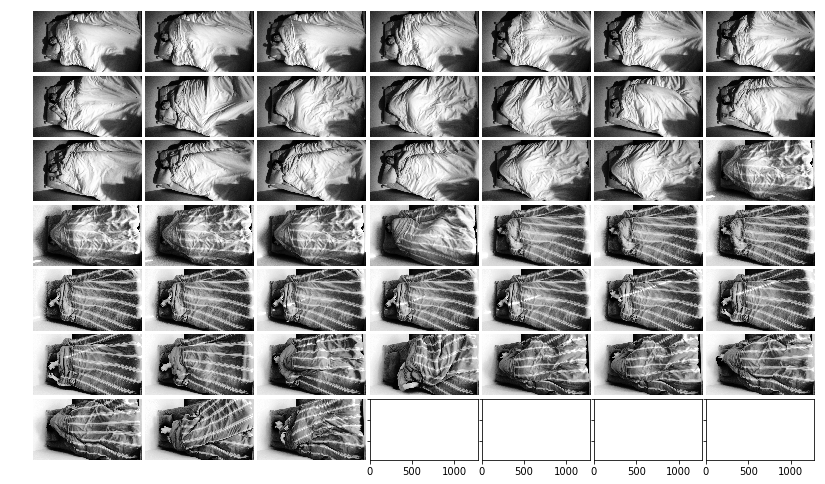

Count: 45



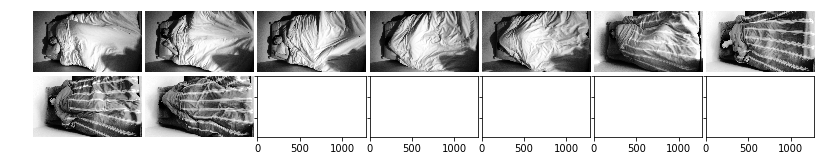

Count: 9

scale: 0.005


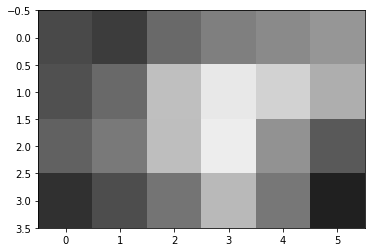

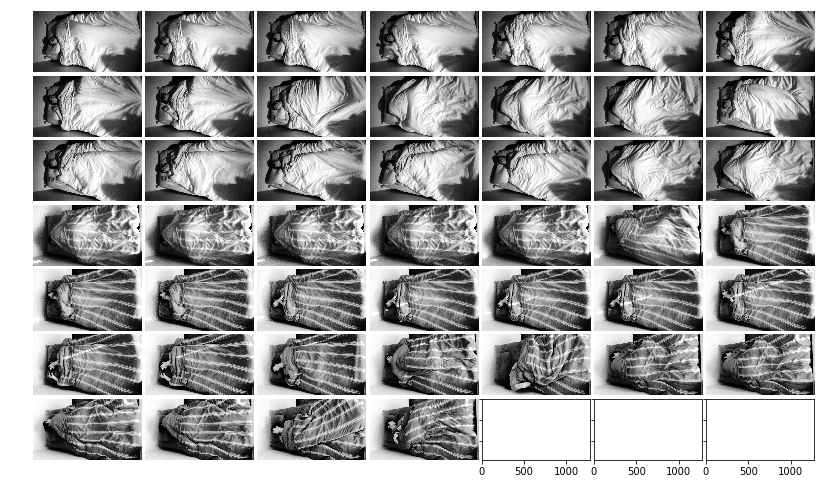

Count: 46



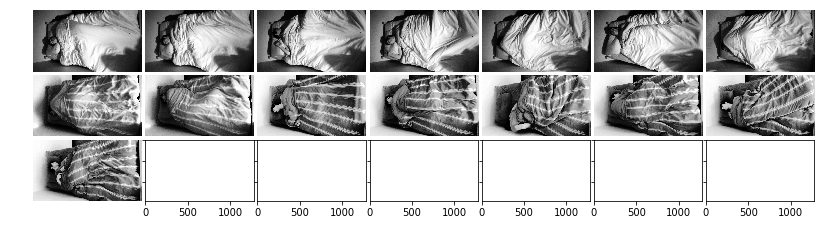

Count: 15

scale: 0.007


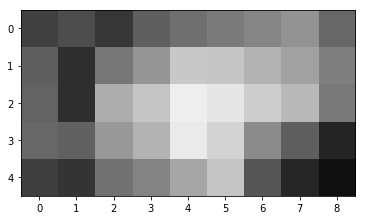

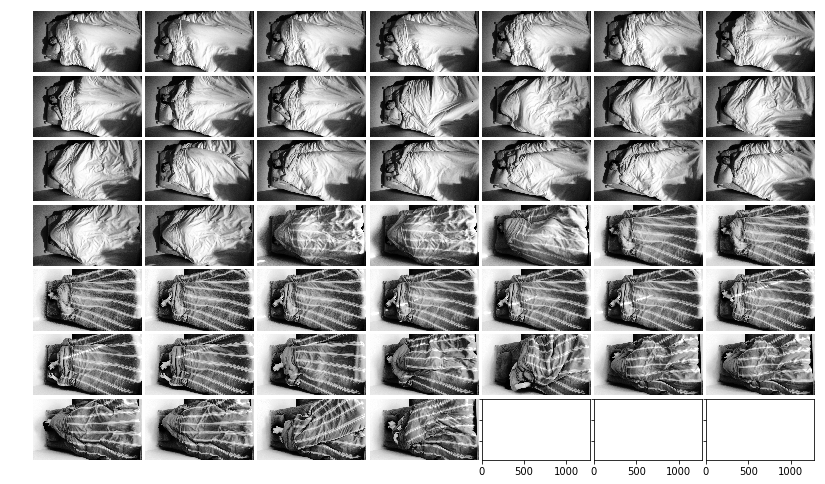

Count: 46



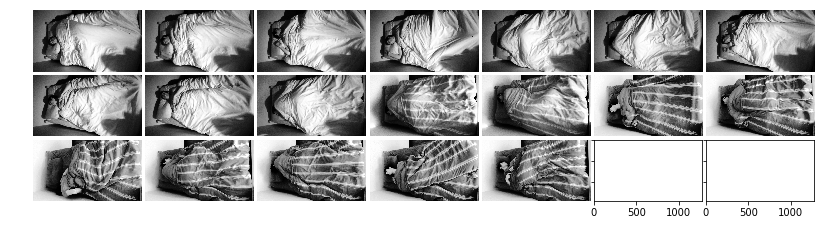

Count: 19

scale: 0.009000000000000001


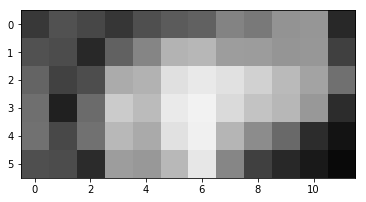

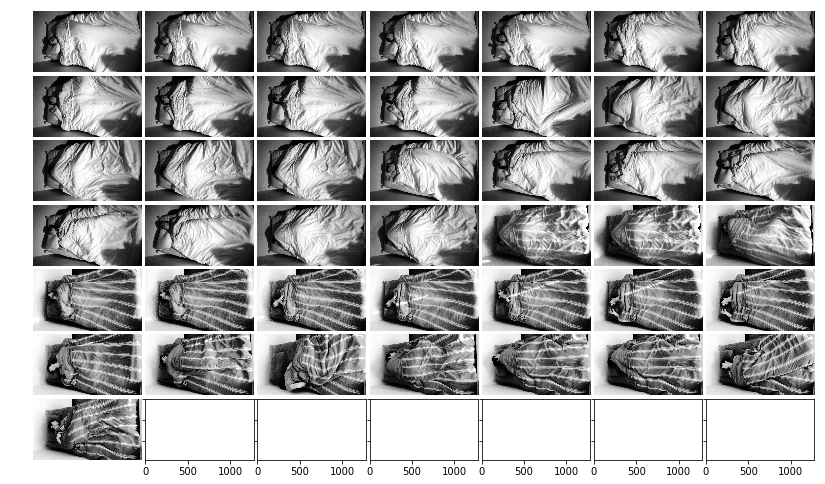

Count: 43



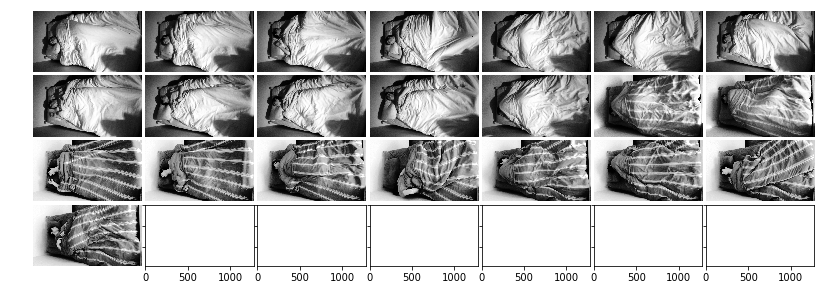

Count: 22



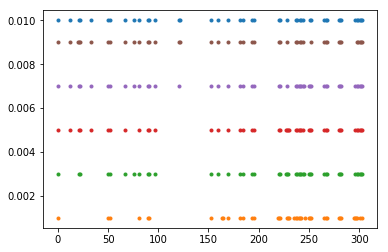

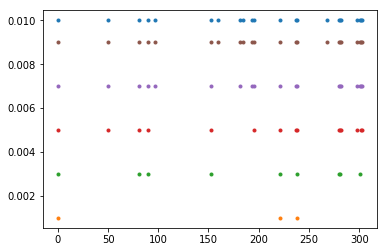

Sift_t: [0, 21, 22, 50, 52, 67, 81, 90, 91, 97, 153, 159, 169, 181, 184, 193, 195, 220, 221, 228, 237, 238, 241, 242, 244, 251, 252, 265, 267, 268, 280, 281, 282, 296, 298, 299, 301, 302, 303]
Sift_std: [0, 81, 90, 153, 221, 238, 280, 281]

39


In [111]:
pr_2 = ImageGrammarProcessor(equalize=False)
t_frames_list_2, std_frames_list_2 = pr.get_sift_frames('./test_data/2019-03-03/', verbose=1)
t_list = pr.get_counts(t_frames_list)
frame_len = len(t_list)
print(frame_len)